<a href="https://colab.research.google.com/github/Harriet101-alt/Texas_Maps/blob/main/Texas%2CAustin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Air BnB listings Texas**

This computational essay investigates the spatial relationship between AirBnB distributions, socio-economic indicators, and land-use patterns in Austin, Texas. By integrating American Community Survey (ACS) data with OpenStreetMap (OSM) features, LISA (Local Indicators of Spatial Association) and DBSCAN clustering is utilised to explore wealth dispersal and economic activity.


In [ ]:
pip install pandas geopandas matplotlib contextily alphashape tesspy osmnx mapclassify

In [38]:
# Core Data Manipulation & Visualization
import pandas as pd
import numpy as np
import re                                     # Regex for ZIP code extraction
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm                    # Colormaps for cluster visualization

# Geospatial Data Handling
import geopandas as gpd                       # Note: Fixed typo from 'gdp' to 'gpd'
import osmnx as ox                            # OpenStreetMap data retrieval
from shapely.geometry import Point, MultiPoint # Geometric object manipulation
import contextily as cx                       # Basemaps for static plots

# Interactive Mapping (Folium)
import folium
from folium.plugins import MarkerCluster, FastMarkerCluster, HeatMap
from folium import LayerControl, FeatureGroup
from branca.element import MacroElement, Html # Custom HTML elements for map legends

# Spatial Statistics & Weights (PySAL Stack)
import libpysal
from libpysal.weights import Queen             # Contiguity-based spatial weights
from esda.moran import Moran, Moran_Local      # Global and Local Spatial Autocorrelation
from splot.libpysal import plot_spatial_weights
from splot.esda import moran_scatterplot
import mapclassify                             # Choropleth classification schemes
from mapclassify import NaturalBreaks

# Machine Learning & Clustering
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA          # Dimensionality reduction
from sklearn.neighbors import NearestNeighbors  # K-distance plots for DBSCAN epsilon
import alphashape                              # Generating concave hulls around clusters

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Data Processing**

In [5]:
listings_file = "/content/drive/MyDrive/listings.csv"
neighbourhood_data = "/content/drive/MyDrive/neighbourhoods.csv"
neighbourhood_map = "/content/drive/MyDrive/neighbourhoods.geojson"

In [6]:
listings = pd.read_csv(listings_file) #convert to dataframe using pandas
df_listings = pd.DataFrame(listings)

In [89]:
#print(listings.head())

In [7]:
#Collect and import data
neighbourhoods = pd.read_csv(neighbourhood_data)
df_neighbourhoods = pd.DataFrame(neighbourhoods)

neighbourhoods_map = pd.read_json(neighbourhood_map)

gdf = gdp.read_file(neighbourhood_map)
#gdf.plot()
#plt.show()

In [8]:
#print(neighbourhoods.head())

In [9]:
print(gdf.crs) #check crs

EPSG:4326


In [10]:
#clean price column
missing_values = listings['price'].isnull().sum()
no_rows = len(df_listings)
no_rows_neighbourhood = len(df_neighbourhoods)
missing_neighbourhood_count = neighbourhoods['neighbourhood'].isnull().sum()

print(f"No. of rows in neighbourhood data: {no_rows_neighbourhood}")
print(f"Data count in listings: {no_rows}")
print(f"Missing price values (NaN): {missing_values}")
print(f"Missing neighbourhood values: {missing_neighbourhood_count}")

No. of rows in neighbourhood data: 44
Data count in listings: 15187
Missing price values (NaN): 4479
Missing neighbourhood values: 0


In [11]:
#Group neighbourhood column
listing_counts = df_listings.groupby('neighbourhood').size().reset_index(name='count')
print(len(listing_counts))

44


In [88]:
"""
Natural breaks was used to group the data, however the numerical boundaries were less interpretible for readers (2-133, 133-293).The highest number of Air BnBs was 2284 and the lowest was 2, which is broad dispersal. The majority of air BnB frequency was 0 -100 with a few higher number of listings to emphaise this distribbution a logarthmic scale was created. Initailly 'Viridis' was used, however I selected 'YlOrRd' as it generates a colour gradient to emphasis the disperal patter of AirBnBs with the highest density being in the city centre and reducing in the outer zones, instade of harsh colour changes within each zipcode.
"""

log_listing_counts = np.log(listing_counts['count'])

listing_counts['log_listing_counts'] = log_listing_counts

mapping_gdf = gdf.copy() # Use the already prepared gdf from previous cells

# Ensure neighbourhood column in listing_counts is string type for merging
listing_counts['neighbourhood'] = listing_counts['neighbourhood'].astype(str)

# Merge listing counts into mapping_gdf
mapping_gdf = mapping_gdf.merge(listing_counts, on='neighbourhood', how='left')

# Rename the 'count' column (from listing_counts) to 'listing_counts' for plotting
mapping_gdf = mapping_gdf.rename(columns={'count': 'listing_counts'})


In [ ]:
#plt.hist(mapping_gdf['listing_counts'], bins=15, edgecolor='black')
#plt.title('Histogram of Listing Counts')
#plt.xlabel('Listing Count')
#plt.ylabel('Frequency')
#plt.show()

In [15]:
#df for price, with missing values removed
df_for_price = df_listings.dropna(subset=['price'])
print(len(df_for_price))

10708


In [16]:
#calculate average price
avg_price = df_for_price.groupby('neighbourhood')['price'].mean().reset_index(name='avg_price')
#print(avg_price.head(5))


In [18]:
gdf['neighbourhood'] = gdf['neighbourhood'].astype(str) #converts zipcodes to strings, prevents dropping of zeros
avg_price['neighbourhood'] = avg_price['neighbourhood'].astype(str)

#create choropleths
#binning data
#sequential colour ramp for price

min_price = avg_price['avg_price'].min()
max_price = avg_price['avg_price'].max()
median_price = avg_price['avg_price'].median()

print(f"Min price: {min_price}")
print(f"Max price: {max_price}")
print(f"median price: {median_price}")
print(f"Average price: {avg_price['avg_price'].mean()}")

#plt.hist(avg_price['avg_price'], bins=10, edgecolor='black')
#plt.title('Histogram of Average Prices')
#plt.xlabel('Average Price')
#plt.ylabel('Frequency')
#plt.show()

location_price_stats = df_for_price.groupby('neighbourhood')['price'].agg(
    ['count', 'mean', 'median', 'std']
)

median = df_for_price.groupby('neighbourhood')['price'].median().reset_index(name='median_price')


Min price: 87.66666666666667
Max price: 6062.258620689655
median price: 180.7304989314483
Average price: 507.70452409629286


In [19]:
gdf = gdp.read_file(neighbourhood_map)
gdf['neighbourhood'] = gdf['neighbourhood'].astype(str)

# Ensure listing_counts['neighbourhood'] is string type before merging
listing_counts['neighbourhood'] = listing_counts['neighbourhood'].astype(str)
gdf = gdf.merge(listing_counts, on='neighbourhood', how='left')
gdf = gdf.rename(columns={'count': 'listing_count'})

# Ensure avg_price['neighbourhood'] is string type before merging
avg_price['neighbourhood'] = avg_price['neighbourhood'].astype(str)
gdf = gdf.merge(avg_price, on='neighbourhood', how='left')

# Ensure median['neighbourhood'] is string type before merging
median['neighbourhood'] = median['neighbourhood'].astype(str)
gdf = gdf.merge(median, on='neighbourhood', how='left')

In [ ]:
#print(gdf.isna().sum())

neighbourhood           0
neighbourhood_group    44
geometry                0
listing_count           0
avg_price               0
median_price            0
dtype: int64


In [20]:
#plt.hist(gdf['avg_price'])


In [87]:
# Ensure your 'neighbourhood' columns are of the same type
gdf['neighbourhood'] = gdf['neighbourhood'].astype(str)
listing_counts['neighbourhood'] = listing_counts['neighbourhood'].astype(str)

# Merge the GeoDataFrame with the listing counts DataFrame
mapping_gdf = gdf.merge(listing_counts, on='neighbourhood', how='left')

# Rename the 'count' column to 'listing_counts' for consistency with downstream cells
mapping_gdf = mapping_gdf.rename(columns={'count': 'log_listing_counts'})


In [86]:
import folium
import mapclassify
import numpy as np

# 1. Prepare data (Ensure columns are named correctly)
# Assuming mapping_gdf already exists and has 'avg_price' and 'listing_counts'
mapping_gdf_display = mapping_gdf.copy()

# Format strings for tooltips (e.g., "$150" or "45 listings")
mapping_gdf_display['price_str'] = mapping_gdf_display['log_average_price'].apply(lambda x: f"${np.expm1(x):,.2f}" if pd.notnull(x) else "N/A")
mapping_gdf_display['count_str'] = mapping_gdf_display['log_listing_counts'].apply(lambda x: f"{int(x):,}" if pd.notnull(x) else "0")

# 2. Initialize Map
m = folium.Map(location=[30.2672, -97.7431], zoom_start=11)

# 3. Layer 1: Number of Listings (Yellow-Orange-Red)
# Using Natural Breaks to define the bins for the color scale
listing_bins = mapclassify.NaturalBreaks(mapping_gdf_display['log_listing_counts'].dropna(), k=6).bins.tolist()
listing_bins = [mapping_gdf_display['log_listing_counts'].min()] + listing_bins

cp1 = folium.Choropleth(
    geo_data=mapping_gdf_display.to_json(),
    name='Number of Listings per Neighbourhood',
    data=mapping_gdf_display,
    columns=['neighbourhood', 'log_listing_counts'],
    key_on='feature.properties.neighbourhood',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Total AirBnB Listings (Lg)',
    bins=listing_bins,
    highlight=True,
    overlay=False  # Makes this a radio button toggle
).add_to(m)

# Tooltip for Listings
cp1.geojson.add_child(
    folium.features.GeoJsonTooltip(
        fields=['neighbourhood', 'count_str'],
        aliases=['Neighbourhood:', 'Total Listings:'],
        localize=True
    )
)

# 4. Layer 2: Average Price (Purples or YlOrRd per your preference)
# Using Quantiles to define price bins based on LOG average price
price_bins = mapclassify.Quantiles(mapping_gdf_display['log_average_price'].dropna(), k=6).bins.tolist()
price_bins = [mapping_gdf_display['log_average_price'].min()] + price_bins

cp2 = folium.Choropleth(
    geo_data=mapping_gdf_display.to_json(),
    name='Log Average Price per Neighbourhood',
    data=mapping_gdf_display,
    columns=['neighbourhood', 'log_average_price'],
    key_on='feature.properties.neighbourhood',
    fill_color='Purples',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Lg Average Nightly Price ($)',
    bins=price_bins,
    highlight=True,
    overlay=False  # Toggle between the two
).add_to(m)

# Tooltip for Price
cp2.geojson.add_child(
    folium.features.GeoJsonTooltip(
        fields=['neighbourhood', 'price_str'],
        aliases=['Neighbourhood:', 'Avg Price:'],
        localize=True
    )
)

# 5. Add Control and Display
folium.LayerControl(collapsed=False).add_to(m)
m


Austin’s AirBnB listings cluster in the South-Central corridor (78704) and North-Eastern tech hubs (78758), while the affluent West remains nearly empty due to exclusionary zoning. This forces the sharing economy into denser districts where it competes with long-term rentals. A logarithmic scale reveals western outliers costing $6000. Comparing density to price shows an inverse relationship: high availability in central hubs drives competition and lowers prices, whereas restricted supply in the West maintains a significant cost premium.

**Socio-Economic Data**



The ACS data was selcted was median income and renter-occupier units. Renter-occupier units is a measure of occupied housing units where the resident is a renter. This was calculated as a percentage to be more representative.

In [23]:
import zipfile
import os
import pandas as pd

zip_path_income = "/content/drive/MyDrive/median_icome.zip"
zip_path_financial = "/content/drive/MyDrive/financial_data.zip"

# Define the directory to extract files to
extract_dir_income = "/content/median_income_data"
extract_dir_financial = "/content/financial_data"

os.makedirs(extract_dir_income, exist_ok=True)
os.makedirs(extract_dir_financial, exist_ok=True)

# Unzip the income file
with zipfile.ZipFile(zip_path_income, 'r') as zip_ref:
    zip_ref.extractall(extract_dir_income)

# Unzip the financial file
with zipfile.ZipFile(zip_path_financial, 'r') as zip_ref:
    zip_ref.extractall(extract_dir_financial)

# Specify the name of the CSV files you want to read
csv_file_income_name = 'ACSST5Y2023.S1903-Data.csv'
csv_file_financial_name = 'ACSST5Y2023.S2503-Data.csv'

csv_file_income_path = os.path.join(extract_dir_income, csv_file_income_name)
csv_file_financial_path = os.path.join(extract_dir_financial, csv_file_financial_name)

# Read the specific CSV files into separate DataFrames
df_income = pd.read_csv(csv_file_income_path, header=1)
df_financial = pd.read_csv(csv_file_financial_path, header=1)

#display(df_income.head())

#display(df_financial.head())


In [24]:
# Extract neighbourhood (zip code) from 'Geographic Area Name' for df_income
df_income['neighbourhood'] = df_income['Geographic Area Name'].apply(lambda x: re.search(r'\d{5}', x).group(0) if re.search(r'\d{5}', x) else None)
df_income['neighbourhood'] = df_income['neighbourhood'].astype(str)

# Extract neighbourhood (zip code) from 'Geographic Area Name' for df_financial
df_financial['neighbourhood'] = df_financial['Geographic Area Name'].apply(lambda x: re.search(r'\d{5}', x).group(0) if re.search(r'\d{5}', x) else None)
df_financial['neighbourhood'] = df_financial['neighbourhood'].astype(str)

# Perform the merges, reassigning the result to mapping_gdf
mapping_gdf = mapping_gdf.merge(df_income, on='neighbourhood', how='left')
mapping_gdf = mapping_gdf.merge(df_financial, on='neighbourhood', how='left')

In [25]:
median_income_col = 'Estimate!!Median income (dollars)!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households'
renter_occupied_col = 'Estimate!!Renter-occupied housing units!!Occupied housing units'
total_housing_col = 'Estimate!!Occupied housing units!!Occupied housing units'

renter_perc_series = (
    (mapping_gdf[renter_occupied_col] / mapping_gdf[total_housing_col]) * 100
).where(mapping_gdf[total_housing_col] != 0, np.nan)

# Select and rename the columns
mapping_gdf['median_income'] = mapping_gdf[median_income_col]
mapping_gdf['renter_perc'] = renter_perc_series

# Convert to numeric, coercing errors
mapping_gdf['median_income'] = pd.to_numeric(mapping_gdf['median_income'], errors='coerce')
mapping_gdf['renter_perc'] = pd.to_numeric(mapping_gdf['renter_perc'], errors='coerce')

# Calculate medians
median_income_mean = mapping_gdf['median_income'].mean()
renter_occupied_mean = mapping_gdf['renter_perc'].mean()

# Fill NaN values with medians
mapping_gdf['median_income'].fillna(median_income_mean, inplace=True);
mapping_gdf['renter_perc'].fillna(renter_occupied_mean, inplace=True);

print("Median Income and Renter Occupied columns processed and NaN values filled.")
#print(mapping_gdf[['neighbourhood', 'median_income', 'renter_occupied']].head())

Median Income and Renter Occupied columns processed and NaN values filled.


/tmp/ipython-input-2396590774.py:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  mapping_gdf['median_income'].fillna(median_income_mean, inplace=True);
/tmp/ipython-input-2396590774.py:23: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value

In [77]:
import folium

# 1. Initialize the map centered on Austin
m = folium.Map(location=[30.2672, -97.7431], zoom_start=11)

# 2. Add Median Income Choropleth (Blue Layer)
cp1 = folium.Choropleth(
    geo_data=mapping_gdf.to_json(),
    name='Median Income (USD)',        # This name appears in the Layer Control
    data=mapping_gdf,
    columns=['neighbourhood', 'median_income'],
    key_on='feature.properties.neighbourhood',
    fill_color='Blues',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Median Income',
    highlight=True,
    bins=5,
    overlay=False                      # Makes it a base-toggle (Radio Button)
).add_to(m)

# Attach Tooltip to Income Layer
cp1.geojson.add_child(
    folium.features.GeoJsonTooltip(
        fields=['neighbourhood', 'median_income'],
        aliases=['Neighbourhood:', 'Median Income ($):'],
        localize=True
    )
)

# 3. Add Renter Percentage Choropleth (Red Layer)
cp2 = folium.Choropleth(
    geo_data=mapping_gdf.to_json(),
    name='Renter Occupancy (%)',       # This name appears in the Layer Control
    data=mapping_gdf,
    columns=['neighbourhood', 'renter_perc'],
    key_on='feature.properties.neighbourhood',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Renter %',
    highlight=True,
    bins=5,
    overlay=False                      # Makes it a base-toggle (Radio Button)
).add_to(m)

# Attach Tooltip to Renter Layer
cp2.geojson.add_child(
    folium.features.GeoJsonTooltip(
        fields=['neighbourhood', 'renter_perc'],
        aliases=['Neighbourhood:', 'Renters (%):'],
        localize=True
    )
)

# 4. Add the Layer Control to the map
folium.LayerControl(collapsed=False).add_to(m)

# Display Map
m

**Map 2**

Austin exhibits sharp socio-economic polarization. High-income clusters in the West align with Environmental Amenity theory (Conway, 2009), while rental density peaks in the central I-35 corridor—a divide rooted in the 1928 Austin City Plan (Tretter, 2012). This manifests in a widening wealth gap between owners and renters. Regions in the East (high rent/low income) indicate housing precarity, whereas the central-west belt suggests the 'AirBnB effect' (Wachsmuth & Weisler, 2018), where tourism demand competes with residential supply. Methodology follows Brewer’s (2003) principles, using high-contrast sequential schemes to ensure accessibility and clarity in identifying these socio-economic trends.

**Methodology**

To ensure accessibility, color scales follow Brewer’s (2003) cartographic principles. 'Blues' and 'OrRd' sequential schemes were used to provide high contrast for color-blind users while avoiding problematic red-green scales. Interactive tooltips were implemented to allow users to quantify these socio-economic trends, confirming that the central belt sustains the city's highest rental density.



In [ ]:
print(mapping_gdf.columns)

Index(['neighbourhood', 'neighbourhood_group', 'geometry', 'listing_count',
       'avg_price', 'median_price', 'count', 'log_average_price'],
      dtype='object')


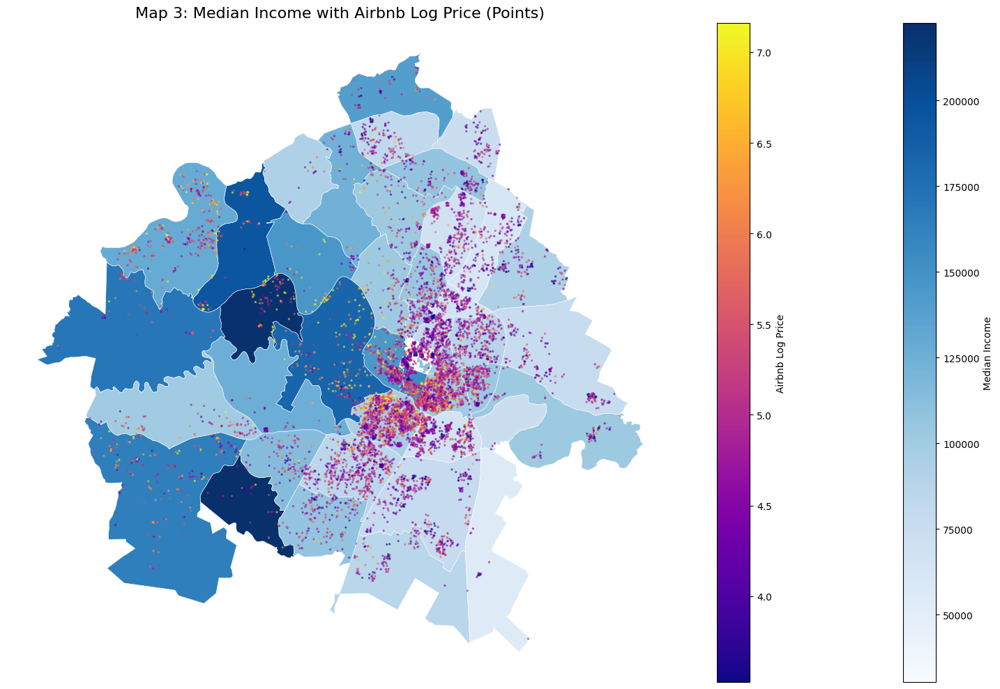

In [31]:
fig, ax = plt.subplots(figsize=(16, 10))

# Polygons: median-income
mapping_gdf.plot(
    column='median_income',
    cmap='Blues',
    legend=True,
    edgecolor='white',
    linewidth=0.4,
    ax=ax,
    legend_kwds={'label': "Median Income"}
)

# Airbnb points: use raw listings file + log price
listings = pd.read_csv(listings_file)

airbnb_points = gpd.GeoDataFrame(
    listings,
    geometry=gpd.points_from_xy(listings.longitude, listings.latitude),
    crs="EPSG:4326"
)


airbnb_points['log_price'] = np.log(airbnb_points['price'])

min_log_pice = airbnb_points['log_price'].quantile(0.02)
max_log_price = airbnb_points['log_price'].quantile(0.98)

# Plot points
airbnb_points.plot(
    column='log_price',
    cmap='plasma',
    markersize=2,
    alpha=0.5,
    ax=ax, # Ensure points are plotted on the same axes
    legend=True,
    vmin = min_log_pice,
    vmax = max_log_price,
    legend_kwds={
        'label': "Airbnb Log Price"
                 }
)

ax.set_title(
    "Map 3: Median Income with Airbnb Log Price (Points)",
    fontsize=16
)

ax.axis("off")
plt.tight_layout()
plt.show()

**Map 3**
In Austin, AirBnB listings are concentrated in the central core—areas characterized by high renter occupancy rather than peak median income. While this removes housing from the long-term market and exerts upward pressure on rents, it creates a "Rent Gap" capitalization where tourism revenue is injected into mid-to-lower income neighborhoods. This stimulates local commerce as guests spend on surrounding services and businesses, recirculating capital within traditionally less prosperous regions.

Conversely, the wealthiest Western suburbs remain largely devoid of short-term rentals. This is primarily due to exclusionary zoning and restrictive Homeowners Association (HOA) rules that preserve owner-occupied, single-family environments. Consequently, the AirBnB market is forced into denser, less regulated central areas, where it competes directly with long-term renters for a limited housing supply, disproportionately impacting lower-income residents and potentially fueling displacement over equitable economic uplift.

In [32]:
# Spatial weights
w = libpysal.weights.contiguity.Queen.from_dataframe(mapping_gdf)
w.transform = 'r'

y = mapping_gdf['median_income'].values #sets the value for LISA

# Moran's I
moran = Moran(y, w)
print("Moran’s I:", moran.I)
print("p-value:", moran.p_sim)

Moran’s I: 0.420671525523409
p-value: 0.001


/tmp/ipython-input-1798046867.py:2: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = libpysal.weights.contiguity.Queen.from_dataframe(mapping_gdf)


In [33]:

lisa = esda.Moran_Local(y, w)

mapping_gdf['lisa_sig'] = lisa.p_sim < 0.05
mapping_gdf['quadrant'] = lisa.q # stores quadrant



/usr/local/lib/python3.12/dist-packages/esda/moran.py:1354: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


In [34]:


#fig,ax = moran_scatterplot(lisa, p=.05)

#ax.set_xlabel("Median Income")
#ax.set_ylabel("log price air BnB")

#plt.show()

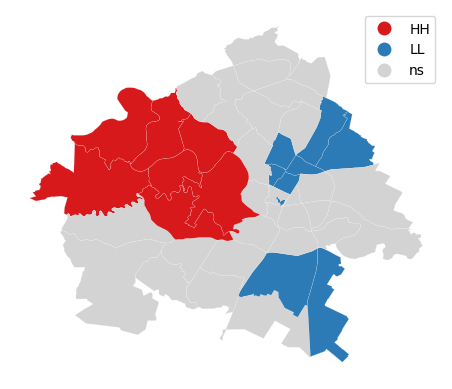

In [ ]:
from splot.esda import (
    moran_scatterplot, lisa_cluster
)
lisa_cluster(lisa, mapping_gdf)
plt.show()

**Map 4**

LISA analysis confirms statistically significant income divides: 'High-High' clusters in the West and 'Low-Low' clusters in Central-North and South. Exclusionary zoning protects these wealthy enclaves by prohibiting the low-income rental units that would break homogeneity (Conway, 2009). Conversely, non-significant (grey) regions in the inner city may reflect gentrification. As high-income renters move into historically lower-income areas, they create a 'Rent Gap' (Wachsmuth & Weisler, 2018) and a spatial 'checkerboard' of income that lacks traditional clustering patterns. This highlight's Austin's transition from a segregated city to a fragmented, gentrifying urban landscape.

**DBSCAN**

For DBSCAN tags were grouped into the following categories: high-density residential areas define


*   housing supply
*   CBD and commercial activity
* local amenities
* natural cover

 I felt that the categoriesation of tags supported more meaningful culstering for policy-making/ city-planning. Initially tags for transport was included too, however features such as bus stops are widely dispersed so clustered very poorly and created excess noise.  


In [35]:
OSM_FEATURE_MAP = {
    # 1. High-Density Residential (Provides necessary context to separate activity types)
    "F_HIGH_DENSITY_RES": [
        ('building', 'apartments'),
        ('building', 'condominium'),
        ('building', 'multi_family'),
        ('building', 'dormitory'),
        ('building', 'terrace'),  # Medium density
        ('building', 'service_apartment'),
    ],

    # 2. Central Business District (CBD) Activity (High Intensity Use)
    "F_CBD_ACTIVITY": [
        ('building', 'office'),
        ('building', 'commercial'),
        ('amenity', 'bank'),
        ('amenity', 'university'),
        ('amenity', 'hospital'),
        ('amenity', 'clinic'),
        ('shop', 'mall'),
        ('tourism', 'hotel'),
    ],

    # 3. Local Commerce & Social Amenities (Walkability)
    "F_LOCAL_AMENITY": [
        ('amenity', 'restaurant'),
        ('amenity', 'cafe'),
        ('amenity', 'bar'),
        ('shop', 'supermarket'),
        ('shop', 'convenience'),
        ('amenity', 'school'),
        ('amenity', 'library'),
        ('amenity', 'pharmacy'),
    ],

    # 5. Natural & Open Space (Quality of Life)
    "F_NATURAL_COVER": [
        ('landuse', 'forest'),
        ('leisure', 'park'),
        ('leisure', 'playground'),
    ]
}

# SET STUDY AREA AND DOWNLOAD DATA

place = "Austin, Texas, USA"
tags = {}
for category, tag_list in OSM_FEATURE_MAP.items():
    for key, value in tag_list:
        if key not in tags:
            tags[key] = []
        tags[key].append(value)
for key in tags:
    tags[key] = list(set(tags[key]))

print("Downloading POIs for Austin")
# Download all POIs matching the defined tags
gdf_pois = ox.features_from_place(place, tags)

# Reproject to a local UTM zone (Austin is in UTM Zone 14N - EPSG 32614)
print("Reprojecting data...")
gdf_pois = gdf_pois.to_crs(epsg=32614)

#DBSCAN uses eps data, therefore setting crs to 32614 ensures accuracy in measurement. 32615 represents UTM Zibe 14N, specific to Central USA and Mexico.
print(f"Total POIs downloaded: {len(gdf_pois)}")

Reprojecting data...
Total POIs downloaded: 9108


In [39]:
#I looped through the tags and identify unique tages which were marked as 1, others 0.
#feature engineering
#identify unique tags - this is correct
poi_tags = list(set(k for key_list in OSM_FEATURE_MAP.values() for k, v in key_list))
print(f"Unique POI Tags: {poi_tags}")

# The Correct, Robust Functional Feature Engineering:
for category, tag_list in OSM_FEATURE_MAP.items():
    # 1. Initialize result for this category to False (F/T)
    is_category = pd.Series(False, index=gdf_pois.index)

    #Loop through each tag-value pair in the category
    for key, value in tag_list:
        if key in gdf_pois.columns:
            # Create a boolean series (the True/False) by checking the specific tag column
            new_condition = gdf_pois[key].isin([value])

            # Use OR (|) to combine conditions
            is_category = is_category | new_condition

    #Store the final binary feature (1/0)
    gdf_pois[category] = is_category.astype(int)





Unique POI Tags: ['shop', 'building', 'amenity', 'tourism', 'leisure', 'landuse']


In [41]:
#Points were generated as geometries and add to the df_pois data frame which was generated through the DBSCAN.
gdf_pois['geometry'] = gdf_pois.geometry.apply(
    lambda geom: geom.centroid if geom.geom_type != 'Point' else geom
)
gdf_pois['x'] = gdf_pois.geometry.x
gdf_pois['y'] = gdf_pois.geometry.y
print("Coordinate features 'x' and 'y' created.")

Coordinate features 'x' and 'y' created.


In [42]:
#K-nearest neighbour was used to create a feature matrix which measured each group of tags with a concentration score.
NEIGHBORHOOD_RADIUS = 300

functional_features = list(OSM_FEATURE_MAP.keys()) # stores names of functional features

# PREPARE FOR NEIGHBORHOOD SEARCH
# Coordinates (must be projected in meters, e.g., EPSG 32614)
coords = np.vstack([gdf_pois.x, gdf_pois.y]).T

# BUILD THE NEIGHBORHOOD ADJACENCY MATRIX
# Find all neighbors within the defined radius
nn = NearestNeighbors(radius=NEIGHBORHOOD_RADIUS)
nn.fit(coords)
# Adjacency matrix: adj_matrix[i, j] = 1 if point j is a neighbor of point i
adj_matrix = nn.radius_neighbors_graph(coords, mode='connectivity', sort_results=True)


# CALCULATE FUNCTIONAL CONCENTRATION SCORE
new_concentration_features = {}

for category in functional_features:
    # Get the 1/0 vector for the current functional category
    category_vector = gdf_pois[category].values.reshape(-1, 1)

    # Count of neighbors of this type (using the dense matrix representation)
    category_neighbor_count = (adj_matrix @ category_vector).flatten()

    # Total count of ALL neighbors (sum of 1s in each row of adj_matrix)
    total_neighbor_count = np.array(adj_matrix.sum(axis=1)).flatten()

    # Calculate the CONCENTRATION (Proportion of the neighbors that are this type)
    # Add a small epsilon (1e-6) to the denominator to prevent division by zero for isolated points
    concentration_score = category_neighbor_count / (total_neighbor_count + 1e-6)

    # Store the new feature
    new_concentration_features[f"{category}_CONC"] = concentration_score

#  FINALIZE FEATURE MATRIX

# Add the new continuous features (Concentration Scores) back to the GeoDataFrame
df_concentration = pd.DataFrame(new_concentration_features, index=gdf_pois.index)
gdf_pois = pd.concat([gdf_pois, df_concentration], axis=1)

# Now feature matrix (X) for DBSCAN uses continuous scores:
concentration_columns = [f'{col}_CONC' for col in functional_features]
feature_columns = ['x', 'y'] + concentration_columns
X = gdf_pois[feature_columns].values

print(concentration_columns)

['F_HIGH_DENSITY_RES_CONC', 'F_CBD_ACTIVITY_CONC', 'F_LOCAL_AMENITY_CONC', 'F_NATURAL_COVER_CONC']


In [43]:
x = np.log1p(X) # transformed data to log to avoid loss from standard scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
# Run DBSCAN on X_scaled

Feature engineering was applied for meaningful clustering Fang et al. (2025). I apllied a logarithmic + 1 function to avoid value removal from normalisation. Nearest neighbour of 300m was used to measure the concentration score.

$$\text{Concentration Score}_i = \frac{\text{Count of neighbors of type } C \text{ within } 300\text{m}}{\text{Total count of all neighbors within } 300\text{m}}$$



In [44]:
DBSCAN_EPS = 0.7  # Re-tuned for the scaled data
DBSCAN_MIN_SAMPLES = 20

db = DBSCAN(eps=DBSCAN_EPS, min_samples=DBSCAN_MIN_SAMPLES)
clusters = db.fit_predict(X_scaled)

# Store results back to GeoDataFrame
gdf_pois['cluster_id'] = clusters

print(f"DBSCAN finished. Found {gdf_pois['cluster_id'].max() + 1} non-noise clusters.")

DBSCAN finished. Found 9 non-noise clusters.


While a physical radius of 300 meters was used to calculate the initial functional concentration of POIs, the final DBSCAN clustering used a standardized epsilon ($\epsilon$) of 0.7. This represents 0.7 standard deviations in a multivariate feature space including geographical coordinates and land-use intensity scores. This approach ensures that clusters are defined by physical proximity and socio-economic character.

In [45]:
"""
DBSCAN clusters were converted into tangible geographical polygons using the Alpha Shape (Concave Hull) algorithm, which tightly traced the boundary of each cluster of activity. These better show patterns of land-use rather than singular points.
"""
# Define the Alpha-Shape Parameter (Controls polygon tightness)
# This is a key tuning parameter
ALPHA_VALUE = 0.002

# Calculate Concave Hull for each cluster
clustered_hulls = []

# Filter out noise points (cluster_id = -1)
clustered_points = gdf_pois[gdf_pois['cluster_id'] != -1]

# Group by the new functional cluster ID
for cluster_id, cluster_data in clustered_points.groupby('cluster_id'):
    # Extract the projected coordinates (X, Y)
    points = cluster_data[['x', 'y']].values

    # Generate the Concave Hull (Alpha Shape)
    try:
        # alphashape requires a list of shapely Point objects or coordinates
        hull = alphashape.alphashape(points, ALPHA_VALUE)
    except:
        # Fallback to Convex Hull if alpha shape fails (e.g., too few points)
        hull = MultiPoint(points).convex_hull

    # Ensure the hull is a Polygon or MultiPolygon before adding
    if hull.geom_type in ['Polygon', 'MultiPolygon']:
        clustered_hulls.append({
            'cluster_id': cluster_id,
            'geometry': hull
        })

# Create the Cluster GeoDataFrame
gdf_clusters = gpd.GeoDataFrame(
    clustered_hulls,
    crs=gdf_pois.crs
)

print(f"Generated {len(gdf_clusters)} functional land use polygons.")

Generated 8 functional land use polygons.


In [46]:
#Joined clusters to gdf_pois
gdf_pois_clustered = gpd.sjoin(
    gdf_pois.to_crs(gdf_clusters.crs),  # Ensure CRS matches for spatial operation
    gdf_clusters[['cluster_id', 'geometry']],
    how="left",
    predicate='within' # Changed 'op' to 'predicate'
)

gdf_pois_clustered = gpd.sjoin(
    gdf_pois,
    gdf_clusters[['cluster_id', 'geometry']], # Select only the ID and Geometry from polygons
    how="left",
    predicate='within' # Changed 'op' to 'predicate'
)

In [47]:
# Define ALL Individual Tag Columns
# The columns to aggregate are the functional categories created earlier
functional_category_columns = list(OSM_FEATURE_MAP.keys())



# Aggregate by Cluster ID
# Filter out noise/unassigned points
# Use 'cluster_id_right' as the cluster ID from the polygon join
clustered_data = gdf_pois_clustered[gdf_pois_clustered['cluster_id_right'].notnull() & (gdf_pois_clustered['cluster_id_right'] != -1)]

# Sum the counts for ALL functional categories within each cluster
individual_tag_sums = clustered_data.groupby('cluster_id_right')[functional_category_columns].sum()

# Calculate Total Tags and Percentages

# Calculate the total count of ALL functional tags (denominator)
individual_tag_sums['TOTAL_TAGS'] = individual_tag_sums[functional_category_columns].sum(axis=1)

# Calculate the percentage for each individual tag
percentage_df_individual = (
    individual_tag_sums[functional_category_columns]
    .div(individual_tag_sums['TOTAL_TAGS'], axis=0) * 100
)

# Prepare Final Output

# Ensure the index is clean
percentage_df_individual.index = percentage_df_individual.index.astype(int)
percentage_df_individual.index.name = 'DBSCAN Cluster ID'

#print("Percentage Breakdown of ALL Original Tags Per Cluster:")
#display(percentage_df_individual.round(2))

In [48]:
# Add dominant category column by applying idxmax to only the numerical columns
percentage_df_individual['dominant_category'] = percentage_df_individual[functional_category_columns].idxmax(axis=1)

# Add the percentage of the dominant category for reference
# This already correctly applies .max(axis=1) only to the functional_category_columns
percentage_df_individual['dominant_category_pct'] = percentage_df_individual[functional_category_columns].max(axis=1)

print("Dominant Functional Category for Each Cluster:")
display(percentage_df_individual[['dominant_category', 'dominant_category_pct']].round(2))

Dominant Functional Category for Each Cluster:


,dominant_category,dominant_category_pct
DBSCAN Cluster ID,,
0,F_HIGH_DENSITY_RES,56.73
1,F_NATURAL_COVER,94.12
2,F_CBD_ACTIVITY,100.00
3,F_NATURAL_COVER,100.00
4,F_NATURAL_COVER,87.50
6,F_HIGH_DENSITY_RES,87.50
7,F_HIGH_DENSITY_RES,93.33


In [49]:
print(gdf_clusters.crs)

EPSG:32614


In [50]:
# Reset index to merge with GeoDataFrame
percentage_df_individual = percentage_df_individual.reset_index()

# Reproject gdf_clusters to WGS84 for Folium from 32614
gdf_clusters_wgs84 = gdf_clusters.to_crs(epsg=4326)

# Merge the dominant category/percentage back into the cluster geodataframe
gdf_clusters_wgs84 = gdf_clusters_wgs84.merge(
    percentage_df_individual[['DBSCAN Cluster ID', 'dominant_category']],
    left_on='cluster_id',
    right_on='DBSCAN Cluster ID',
    how='left'
)

# Remove unnecessary columns after merge
gdf_clusters_wgs84 = gdf_clusters_wgs84.drop(columns=['DBSCAN Cluster ID'])

In [51]:
"""
Cluser 1 was a mixture between high density residential and ammenity. For simplicity the highest percentage was mapped as the polygon to maintain cartographic consistency.
"""
CATEGORY_COLOR_MAP = {
    "F_HIGH_DENSITY_RES": "#d62728",  # Red for High-Density Residential
    "F_CBD_ACTIVITY": "#1f77b4",     # Blue for Central Business District (CBD)
    "F_LOCAL_AMENITY": "#2ca02c",    # Green for Local Commerce & Social Amenities
    "F_NATURAL_COVER": "#9467bd",    # Purple for Natural & Open Space
    "Other": "#CCCCCC"               # Default Gray for unclassified or noise clusters
}

In [52]:
def style_function_polygons(feature):
    """
    Style function that automatically assigns fill colors based on the cluster's dominant_category.
    """
    # Get dominant category for the polygon
    dominant_category = feature['properties']['dominant_category']

    # Map the dominant category to a color
    fill_color = CATEGORY_COLOR_MAP.get(dominant_category, "#CCCCCC")  # Default to gray if missing

    return {
        'fillColor': fill_color,      # Fill color for the polygon
        'color': '#000000',           # Border color
        'weight': 0.5,                # Border thickness
        'fillOpacity': 0.6            # Opacity for polygon fill
    }

In [53]:
#print(gdf_clusters_wgs84) #checked column labels

In [54]:
#explode multipolygons into simple ones, previously had issues with colour fill
gdf_clusters_wgs84 = gdf_clusters_wgs84.explode(
    index_parts=False
).reset_index(drop=True)


In [55]:
gdf_clusters_wgs84["geometry"] = gdf_clusters_wgs84.geometry.buffer(0)


In [56]:
gdf_clusters_wgs84 = (
    gdf_clusters_wgs84
    .dissolve(by="cluster_id", as_index=False)
)

gdf_clusters_wgs84["geometry"] = gdf_clusters_wgs84.geometry.buffer(0)


In [57]:
gdf_pois_wgs84 = gdf_pois.to_crs(epsg=4326) #appropiate crs for Folium

**Map 5**

Preliminary attempts using Folium MarkerClusters proved insufficient for non-technical interpretation, as they failed to distinguish between the various types of urban activity. To resolve this, a dual-visualisation strategy was adopted: a Heatmap to capture continuous urban "pulse" and DBSCAN Polygons to define discrete land-use boundaries.

In [58]:
# Base map
center_lat = gdf_pois_wgs84.geometry.y.mean()
center_lon = gdf_pois_wgs84.geometry.x.mean()

m = folium.Map(location=[center_lat, center_lon],
               zoom_start=12,
               tiles='CartoDB Positron')

# Land Use Polygons Layer
land_use_layer = FeatureGroup(name='Land Use Polygons (Grouped)', show=True)

folium.GeoJson(
    gdf_clusters_wgs84,
    name='Land Use Polygons (Classified)',
    style_function=style_function_polygons,
    tooltip=folium.GeoJsonTooltip(
        fields=['dominant_category', 'cluster_id'],
        aliases=['Dominant Category:', 'Cluster ID:']
    )
).add_to(land_use_layer)

land_use_layer.add_to(m)

# POI Heat Map Layer
poi_coords = [[row.geometry.y, row.geometry.x] for _, row in gdf_pois_wgs84.iterrows()]

poi_heat_layer = FeatureGroup(name='AOI Heatmap', show=True)
HeatMap(
    poi_coords,
    radius=15,
    blur=12,
    min_opacity=0.3
).add_to(poi_heat_layer)

poi_heat_layer.add_to(m)

# Add Layer Control last
LayerControl(collapsed=False).add_to(m)
# Display the map
m

Polgons were grouped into their corresponding  landuse. In many urban regions residential and ammenities are in close proximity, thus there should be an additional category for ammenity/residential. Most land showed as high-density residential. Some outer areas showed as natural land and a few areas in the southern central area were marked as the central business district coinciding with the area of high activity.

There is less residential area and more green space in the western region that high the highest median income, suggesting environmental ammeneties drive affluent homeownership (Conway,2009).

Land-use is granular so the polygons generated from DBSCAN fail to capture the complexity of Austin. However the heatmap does display distinctive regions of high activity in the city centre region. This area would require strong network links, walkable design to avoid excess emissions, strongs policing/management and higher investment to maintain the tourist economy.

The heatmap reveals a high density of POIs in regions characterized by low median income and high renter occupancy. High POI density is a proxy for walkability and desirability, marking these areas as prime targets for the "Rent Gap" capitalization described by Wachsmuth & Weisler (2018).

The market is capitalizing on this desirability through short-term rental supply and commercial services, rather than long-term residential equity. Maintaining these zones as sustainable parts of the tourist economy requires targeted investment in Transit-Oriented Development (TOD) and walkable design to mitigate carbon emissions, alongside robust policing and management to support high-density urban activity.

**References**

Brewer, C. A. (2003). A Transition in the Development of Color Schemes for Cartography.

Conway, T. M. (2009). The local, regional, and global context of land-use change: A case study of Austin, Texas.

Fang, C., Zhou, L., Gu, X., Liu, X., & Werner, M. (2025). A data driven approach to urban area delineation using multi source geospatial data. Scientific Reports, 15(1), 8708.

Harrower, M., & Brewer, C. A. (2003). ColorBrewer.org: An Online Tool for Selecting Colour Schemes for Maps. The Cartographic Journal, 40(1), 27–37.

Tretter, E. M. (2012). Austin Restricted: Progressivism, Zoning, Private Racial Covenants, and the Making of a Racially Segregated City. Final Report. Austin, TX: The Institute for Urban Policy Research & Analysis (IUPRA), University of Texas at Austin.
Wachsmuth, D., & Weisler, A. (2018). Airbnb and the Rent Gap: Gentrification through the Sharing Economy.
U.S. Census Bureau (2024). American Community Survey (ACS) 5-Year Estimates.